<a href="https://colab.research.google.com/github/Karthik31Reddy/yolov8-detection/blob/main/obj_det.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 91.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 33.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 37.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 17.8MB/s]


In [ ]:
from google.colab import files
from PIL import Image

uploaded = files.upload()
image_path = next(iter(uploaded))
image = Image.open(image_path)
image.show()


Saving download.jpeg to download (1).jpeg



image 1/1 /content/download (1).jpeg: 320x640 3 cars, 141.5ms
Speed: 6.2ms preprocess, 141.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)


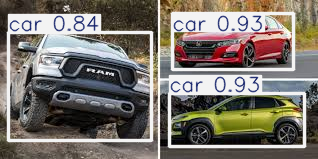

In [ ]:
results = model(image_path)
# Display the first result in the list
results[0].show()

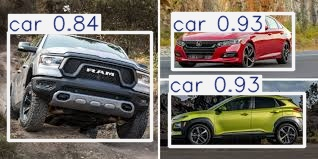

In [ ]:
results[0].save(filename="detected_image.jpg")
from IPython.display import Image as IPImage
IPImage("detected_image.jpg")

In [ ]:
from google.colab import files

uploaded = files.upload()  # Upload your .mp4 or .webm video file
video_path = next(iter(uploaded))  # Get the filename from upload
print("Uploaded video:", video_path)


Saving stock-footage-car-moving-on-the-road-th-jan-hyderabad-india.webm to stock-footage-car-moving-on-the-road-th-jan-hyderabad-india.webm
Uploaded video: stock-footage-car-moving-on-the-road-th-jan-hyderabad-india.webm


In [ ]:
# Run object detection and save the output video
results = model.predict(video_path, save=True)



WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/235) /content/stock-footage-car-moving-on-the-road-th-jan-hyderabad-india.webm: 352x640 1 person, 4 cars, 174.8ms
video 1/1 (frame 2/235) /content/stock-footage-car-moving-on-the-road-th-jan-hyderabad-india.webm: 352x640 1 person, 8 cars, 1 bus, 152.2ms
video 1/1 (frame 3/235) /content/stock-footage-car-moving-on-the-road-th-jan-hyderabad-india.webm: 352x640 2 persons, 4 cars, 1 motorcycle, 1 truck, 140.9ms
video 1/1 (frame 4/235) /c

In [ ]:
import glob

video_files = glob.glob("runs/detect/predict*/" + "*.*")
print("Detected output video(s):", video_files)


Detected output video(s): ['runs/detect/predict/stock-footage-car-moving-on-the-road-th-jan-hyderabad-india.avi']


import os

output_path = "runs/detect/predict/video.webm"  # replace with your actual file
print("File size (bytes):", os.path.getsize(output_path))


In [ ]:
import os

output_path = "runs/detect/predict/stock-footage-car-moving-on-the-road-th-jan-hyderabad-india.avi"
print("File size (bytes):", os.path.getsize(output_path))


File size (bytes): 9580486


In [ ]:
from IPython.display import Video
Video(output_path, embed=True)


In [ ]:
from google.colab import files
files.download(output_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>